# Computer Vision Project
#### Introduction to Machine learning course | Instructor: Dr. Fatemeh Mirsalehi

<font color='cyan'> Responsible TA: Amirhossein Razlighi </font>

In [1]:
%pip install torch torchvision numpy matplotlib Pillow

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt

## Section 1: Implementing a CNN from scratch! (30 points)

### 1.1 - Forward and Backward (20/30 pts)

__CNN__ s are powerfull tools to work with in the scope of _Computer Vision_. You have seen MLPs before and know how to do forward and backward pass on them. In this part, we want to create a convolutional layer (a simple one, of course!) just to understand well that how a Convolutional Layer works, behind the scenes. Then, we can simply use PyTorch's `Conv2D` layer for the rest of this project, because we understood that how Convolutions work, behind the scene!

__FORWARD PASS__:

In forward pass, you should apply the convolution operation on the input image. The convolution operation is as follows:

$$
\text{output}[i, j] = \sum_{k=0}^{K-1} \sum_{l=0}^{L-1} \text{input}[i+k, j+l] \times \text{kernel}[k, l]
$$

You can see a sample convolution operation (with a $3 \times 3$ kernel) in the following image:
<div style="text-align:center;">
  <img src="./Images/Conv.gif" />
</div>

Please note that, these are samples for you to understand the operation better. For _forward pass_ that you should implement, please notice that you should convolve the kernel along all $C$ channels of the input image. So, the output shape should be $(N, H_{out}, W_{out})$. These values are calculated as follows:

$$
H_{out} = \frac{H_{in} + 2 \times \text{padding}}{\text{stride} - HH} + 1
$$
$$
W_{out} = \frac{W_{in} + 2 \times \text{padding}}{\text{stride} - WW} + 1
$$


where $HH$ and $WW$ are the height and width of the kernel, respectively. __stride__ is the step size of the kernel, and __padding__ is the number of zeros that should be padded to the input image. Please also note that $b$ stands for bias, which is a scalar value that should be added to the output of the convolution operation. (for each kernel)

You can see a more detailed example, below:

<div style="text-align:center;">
  <img src="./Images/conv3.gif" />
</div>

__Backward Pass__:

In backward pass, you should calculate gradient of output with respect to the input image and the kernel. These gradients will be used in _optimization_ to update kernel weights. (You saw something similar, in using MLPs with gradient descent algorithm!). So, we need $d_x$, $d_w$ and $d_b$ in the backward pass. These are calculated as follows:

$$
dx_{padded} [n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] += w[f] \times dout[n, f, i, j]
$$

$$
dw_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} x_{padded}[n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] \times dout[n, f, i, j]  
$$

$$
db_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} dout[n, f, i, j]
$$

For better understanding of the backward pass, you can see the following image:

<div style="text-align:center;">
  <img src="./Images/backprop_cs231n.png" />
</div>


In [7]:
import numpy as np

class MyConv:
    def __init__(self, stride, padding):
        self.stride = stride
        self.padding = padding

    def forward(self, x, w, b):
        out = None

        ####### TO DO : Implement Forward pass of Conv2D #######
        ########################################################

        N, C, H, W = x.shape
        F, _, HH, WW = w.shape
        pad = self.padding
        stride = self.stride
        H_out = (H + 2 * pad - HH) // stride + 1
        W_out = (W + 2 * pad - WW) // stride + 1

        x_pad = np.pad(x, ((0, 0), (0, 0), (pad, pad), (pad, pad)), mode='constant')
        out = np.zeros((N, F, H_out, W_out))

        for n in range(N):
          for f in range(F):
            for k in range(H_out):
              for l in range(W_out):
                h_start = k * stride
                h_end = h_start + HH
                w_start = l * stride
                w_end = w_start + WW
                out[n, f, k, l] = np.sum(x_pad[n, :, h_start:h_end, w_start:w_end] * w[f]) + b[f]

        ####### TO DO : End #######
        #############################

        cache = (x, w, b, x_pad)
        self.cache = cache
        return out

    def backward(self, dout):
        dx, dw, db = None, None, None

        x, w, b, x_padded = self.cache

        ####### TO DO : Implement backward pass #######
        ###############################################
        N, C, H, W = x.shape
        F, _, HH, WW = w.shape
        N, F, H_OUT, W_OUT = dout.shape

        dw = np.zeros_like(w)
        dx = np.zeros_like(x)
        db = np.zeros_like(b)

        dx_padded = np.zeros_like(x_padded)

        for n in range(N):
            for f in range(F):
                for i in range(H_OUT):
                    for j in range(W_OUT):
                        dw[f] += x_padded[n, :, i * self.stride: i * self.stride + HH, j * self.stride: j * self.stride + WW] * dout[n, f, i, j]
                        dx_padded[
                            n,
                            :,
                            i * self.stride : i * self.stride + HH,
                            j * self.stride : j * self.stride + WW,
                        ] += w[f] * dout[n, f, i, j]
                        db[f] += dout[n, f, i, j]

        dx = dx_padded[:, :, self.padding:-self.padding, self.padding:-self.padding]
        db = np.sum(db, axis = 0)

        ####### TO DO : End #######
        #############################

        self.dx = dx
        self.dw = dw
        self.db = db
        return dx, dw, db

In [8]:
def rel_error(x, y):
  return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

In [9]:
# A simple test for forward pass (DO NOT CHANGE)

x_shape = (2, 3, 4, 4)
w_shape = (3, 3, 4, 4)
x = np.linspace(-0.1, 0.5, num=np.prod(x_shape)).reshape(x_shape)
w = np.linspace(-0.2, 0.3, num=np.prod(w_shape)).reshape(w_shape)
b = np.linspace(-0.1, 0.2, num=3)

out = MyConv(stride=2, padding=1).forward(x, w, b)
correct_out = np.array([[[[[-0.08759809, -0.10987781],
                           [-0.18387192, -0.2109216 ]],
                          [[ 0.21027089,  0.21661097],
                           [ 0.22847626,  0.23004637]],
                          [[ 0.50813986,  0.54309974],
                           [ 0.64082444,  0.67101435]]],
                         [[[-0.98053589, -1.03143541],
                           [-1.19128892, -1.24695841]],
                          [[ 0.69108355,  0.66880383],
                           [ 0.59480972,  0.56776003]],
                          [[ 2.36270298,  2.36904306],
                           [ 2.38090835,  2.38247847]]]]])

# The outputted difference which is printed, should be around 1e-8
print ('Testing conv_forward_naive')
print ('difference: ', rel_error(out, correct_out))

Testing conv_forward_naive
difference:  2.2121476417505994e-08


In [10]:
def eval_numerical_gradient_array(f, x, df, h=1e-5):
  grad = np.zeros_like(x)
  it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
  while not it.finished:
    ix = it.multi_index

    oldval = x[ix]
    x[ix] = oldval + h
    pos = f(x).copy()
    x[ix] = oldval - h
    neg = f(x).copy()
    x[ix] = oldval

    grad[ix] = np.sum((pos - neg) * df) / (2 * h)
    it.iternext()
  return grad

In [11]:
# A simple test for backward pass (DO NOT CHANGE)

x = np.random.randn(4, 3, 5, 5)
w = np.random.randn(2, 3, 3, 3)
b = np.random.randn(
    2,
)
dout = np.random.randn(4, 2, 5, 5)
conv = MyConv(stride=1, padding=1)

dx_num = eval_numerical_gradient_array(
    lambda x: conv.forward(x, w, b), x, dout
)
dw_num = eval_numerical_gradient_array(
    lambda w: conv.forward(x, w, b), w, dout
)
db_num = eval_numerical_gradient_array(
    lambda b: conv.forward(x, w, b), b, dout
)

out = conv.forward(x, w, b)
dx, dw, db = conv.backward(dout)

# Your printed errors should be around 1e-9
print("Testing conv_backward_naive function")
print("dx error: ", rel_error(dx, dx_num))
print("dw error: ", rel_error(dw, dw_num))
print("db error: ", rel_error(db, db_num))

Testing conv_backward_naive function
dx error:  1.1961819794855396e-09
dw error:  4.417481156087818e-09
db error:  1.0


### 1.2 - Visualizing Convolution results (10/30 pts)

In this part, we try to visualize the results of the convolution operation. We will 2 sample photos (in `Images/Sample`) and then we will use our `MyConv` class to apply some cool convolutions (and see their result on an image).

In [34]:
from PIL import Image

first_img, second_img = Image.open("./Images/Sample/Sharif_1.JPG"), Image.open(
    "./Images/Sample/Sharif_2.jpg"
)
first_img = first_img.resize((256, 256))
second_img = second_img.resize((256, 256))

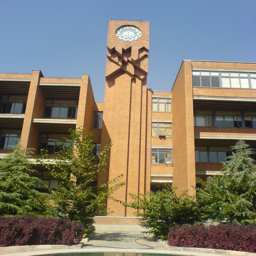

In [30]:
first_img

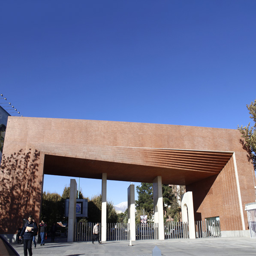

In [31]:
second_img

Convolutions have some interesting usages in image processing. For example, you can extract edges from an image by applying a convolution with a kernel that detects edges. Or you can convolve a specific kernel with your image to make it grayscale or blurred! Look at the definitions below:

__Edge Detection Kernel__:

_Sobel_ is one of the most famous edge detection kernels. It has two kernels, one for detecting vertical edges and the other for horizontal edges. You can see the kernels below:
$$
\text{Sobel}_x = \begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

$$
\text{Sobel}_y = \begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$


__Grayscale Kernel__:

You can simply convolve the image with the following kernel to make it grayscale:

$$
\text{Grayscale\_across\_R} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.3 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_G} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.6 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_B} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.1 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

(Convolve each kernel with its corresponding channel)

__Blurring Kernel__:

One of the famous kernels to blur an image is _Gaussian Blur_. You can see the kernel below:

$$
\text{Gaussian\_Blur} = \frac{1}{16} \times \begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
$$


In [35]:
img_size = 256

x = np.zeros((2, 3, img_size, img_size))
x[0] = np.array(first_img).transpose(2, 0, 1)
x[1] = np.array(second_img).transpose(2, 0, 1)

# a convolution weight, holding 4 filters 3x3
w = np.random.randn(4, 3, 3, 3)

b = np.array([0, 128, 128, 0])

conv = MyConv(stride=1, padding=1)
out = conv.forward(x, w, b)

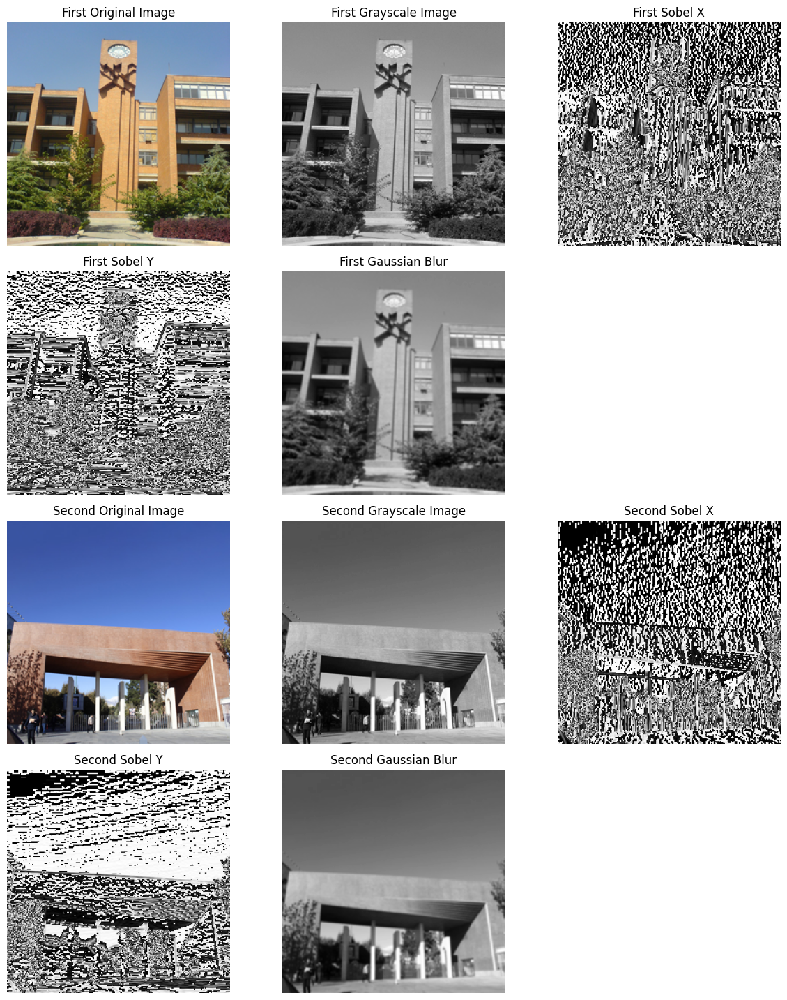

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from PIL import Image

# Function to apply grayscale conversion
def apply_grayscale(image):
    grayscale_r = np.array([[0, 0, 0],
                            [0, 0.3, 0],
                            [0, 0, 0]])

    grayscale_g = np.array([[0, 0, 0],
                            [0, 0.6, 0],
                            [0, 0, 0]])

    grayscale_b = np.array([[0, 0, 0],
                            [0, 0.1, 0],
                            [0, 0, 0]])

    gray_r = ndimage.convolve(image[:,:,0], grayscale_r)
    gray_g = ndimage.convolve(image[:,:,1], grayscale_g)
    gray_b = ndimage.convolve(image[:,:,2], grayscale_b)

    return gray_r + gray_g + gray_b

# Function to apply Sobel edge detection
def apply_sobel(image):
    sobel_x = np.array([[-1, 0, 1],
                        [-2, 0, 2],
                        [-1, 0, 1]])

    sobel_y = np.array([[-1, -2, -1],
                        [0, 0, 0],
                        [1, 2, 1]])

    edges_x = ndimage.convolve(image, sobel_x)
    edges_y = ndimage.convolve(image, sobel_y)

    return edges_x, edges_y

# Function to apply Gaussian blur
def apply_gaussian_blur(image):
    gaussian_kernel = np.array([[1/16, 2/16, 1/16],
                                [2/16, 4/16, 2/16],
                                [1/16, 2/16, 1/16]])

    return ndimage.convolve(image, gaussian_kernel)

first_img_array = np.array(first_img)
second_img_array = np.array(second_img)

# Process first image
first_gray = apply_grayscale(first_img_array)
first_edges_x, first_edges_y = apply_sobel(first_gray)
first_blurred = apply_gaussian_blur(first_gray)

# Process second image
second_gray = apply_grayscale(second_img_array)
second_edges_x, second_edges_y = apply_sobel(second_gray)
second_blurred = apply_gaussian_blur(second_gray)

# Plotting setup for first image
plt.figure(figsize=(12, 18))

# Plot original first image
plt.subplot(5, 3, 1)
plt.imshow(first_img_array)
plt.title('First Original Image')
plt.axis('off')

# Plot grayscale first image
plt.subplot(5, 3, 2)
plt.imshow(first_gray, cmap='gray')
plt.title('First Grayscale Image')
plt.axis('off')

# Plot Sobel x edges for first image
plt.subplot(5, 3, 3)
plt.imshow(first_edges_x, cmap='gray')
plt.title('First Sobel X')
plt.axis('off')

# Plot Sobel y edges for first image
plt.subplot(5, 3, 4)
plt.imshow(first_edges_y, cmap='gray')
plt.title('First Sobel Y')
plt.axis('off')

# Plot Gaussian blur for first image
plt.subplot(5, 3, 5)
plt.imshow(first_blurred, cmap='gray')
plt.title('First Gaussian Blur')
plt.axis('off')

# Plotting setup for second image

# Plot original second image
plt.subplot(5, 3, 7)
plt.imshow(second_img_array)
plt.title('Second Original Image')
plt.axis('off')

# Plot grayscale second image
plt.subplot(5, 3, 8)
plt.imshow(second_gray, cmap='gray')
plt.title('Second Grayscale Image')
plt.axis('off')

# Plot Sobel x edges for second image
plt.subplot(5, 3, 9)
plt.imshow(second_edges_x, cmap='gray')
plt.title('Second Sobel X')
plt.axis('off')

# Plot Sobel y edges for second image
plt.subplot(5, 3, 10)
plt.imshow(second_edges_y, cmap='gray')
plt.title('Second Sobel Y')
plt.axis('off')

# Plot Gaussian blur for second image
plt.subplot(5, 3, 11)
plt.imshow(second_blurred, cmap='gray')
plt.title('Second Gaussian Blur')
plt.axis('off')

plt.tight_layout()
plt.show()

Now that we understood how Convolution works, we proceed further to use it in our models to perform a desired and specific task! We can use PyTorch's `Conv2D` layer from now on, because we understood how Convolutions work, behind the scene!

## Section 2: Neural Style Transfer (90 points)

In this part, we are going to implement a famous technique in the field of _Computer Vision_ called __Neural Style Transfer__. This technique is used to apply the style of a specific image to another image. For example, you can apply the style of a famous painting to your photo! Let's get started!

### 2.1 - Importing Libraries

In [44]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights

import copy

In [45]:
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available() else "cpu"
)
torch.set_default_device(device)
device

device(type='cpu')

### 2.2 - Loading Images and doing some Preprocessing (5/90 pts)

In this part, you should load the content and style images and preprocess them. Preprocessing includes resizing the images to a specific size, normalizing them, and converting them to PyTorch tensors. You can use `torchvision.transforms` to do these tasks.

In [46]:
img_size = 512 if not device == "cpu" else 256

# Define transforms for both content and style images
transform = transforms.Compose([
    transforms.Resize(img_size),                      # Resize to a square image of img_size
    transforms.CenterCrop(img_size),                  # Crop to img_size x img_size around the center
    transforms.ToTensor(),                            # Convert image to PyTorch tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize according to ImageNet standards
                         std=[0.229, 0.224, 0.225])
])


In [52]:
# Paths to your content and style images
style_image_path = 'Images/Neural_Transfer/style.jpeg'
content_image_path = 'Images/Neural_Transfer/Content.jpeg'

# Load and transform style image
style_image = transform(Image.open(style_image_path).convert('RGB')).unsqueeze(0)

# Load and transform content image
content_image = transform(Image.open(content_image_path).convert('RGB')).unsqueeze(0)

# Print sizes of style and content images
style_image.size(), content_image.size()

(torch.Size([1, 3, 512, 512]), torch.Size([1, 3, 512, 512]))

Here, you should implement a helper function to show you images (which are now in form of pytorch tensors) in the notebook. You can use `torchvision.transforms.ToPILImage` to convert a tensor to a PIL image.

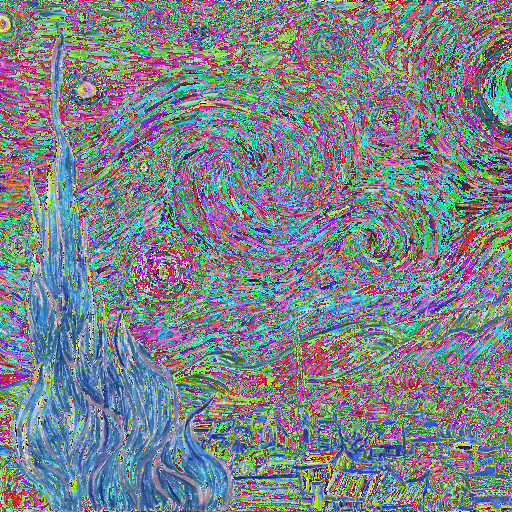

Style Image


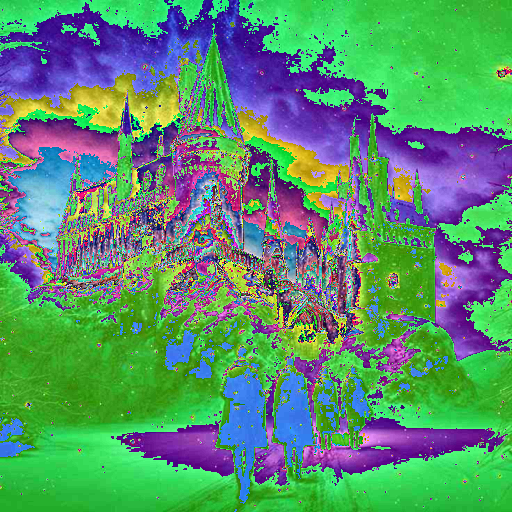

Content Image


In [53]:
import torch
import torchvision.transforms.functional as TF
from PIL import Image
from IPython.display import display

def imshow(tensor, title=None):
    # Convert tensor to PIL image
    image = TF.to_pil_image(tensor.cpu().squeeze())

    # Display image
    display(image)

    # Display title if provided
    if title is not None:
        print(title)

# Example usage:
# Assuming style_image and content_image are already defined as PyTorch tensors

# Display style image with title
imshow(style_image, title='Style Image')

# Display content image with title
imshow(content_image, title='Content Image')

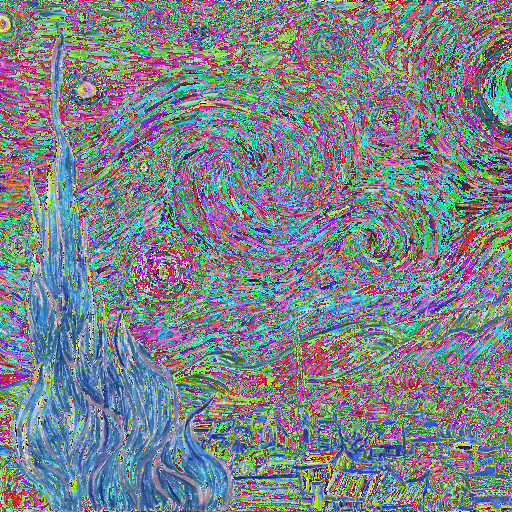

Style Image


In [54]:
imshow(style_image, "Style Image")

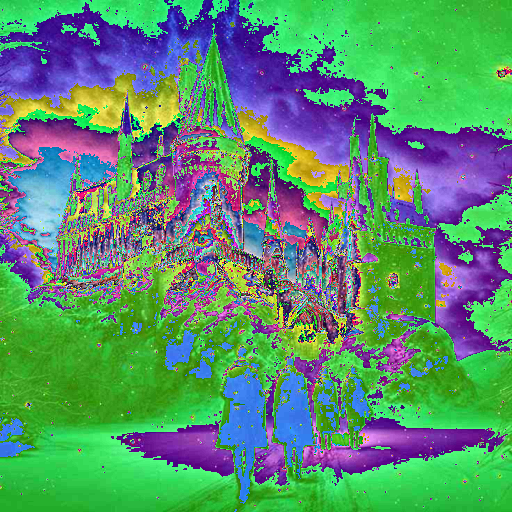

Content Image


In [55]:
imshow(content_image, "Content Image")

### 2.2 - VGG19 Model (15/90 pts)

One of the important parts of Neural Style Transfer is to use a pre-trained model to extract features from the content and style images. Here, we are going to use a pre-trained VGG19 model to extract features from the images. You can use `torchvision.models.vgg19` to load the model. You should also freeze the weights of the model to prevent them from updating during the optimization process.

<div style="text-align:center;">
  <img src="./Images/VGG-19.png" />
</div>

But what is VGG model? Let's see with a simple experiment:

In [56]:
import certifi
import os

os.environ['SSL_CERT_FILE'] = certifi.where()

Here, please load `VGG19` model from `torchvision.models` and see the architecture of the model. You may need models `features` and `classifier` part stored seperately as we will discuss these both parts.

In [57]:
import torchvision.models as models

# Load the pre-trained VGG19 model
vgg19 = models.vgg19(pretrained=True)

# Separate the features and classifier parts
vgg_model_features = vgg19.features
vgg_model_classifier = vgg19.classifier

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:09<00:00, 58.9MB/s]


In [58]:
import torch
import torchvision.models as models
from torchsummary import summary

# Load the pre-trained VGG19 model
vgg19 = models.vgg19(pretrained=True)

# Print the summary of the entire model (features + classifier)
summary(vgg19, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

Please briefly explain what is a VGG model used for and what does each `features` and `classifier` part, represent?

**Your Answer:**

the VGG19 model is used for image classification tasks where the goal is to accurately predict the label or category of an input image. The features part extracts hierarchical features, while the classifier part interprets these features to make a classification decision. This division allows the model to effectively learn and distinguish between different visual patterns in images

Now, we are going to give a sample image `Images/Neural_Transfer/Car.jpeg` to the model, see the output for classification and also visualize the feature maps (outputs of each convolutional layer) to see what's going on!

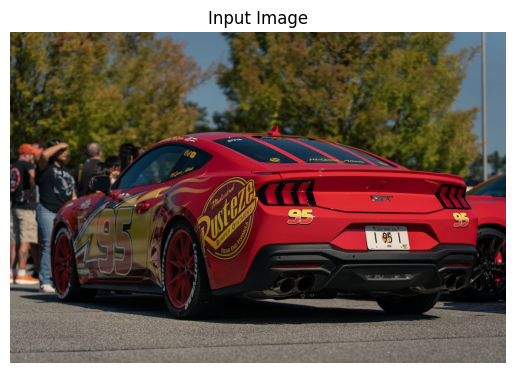

1: racer (0.56) - Predicted class: Unknown
2: sports_car (0.33) - Predicted class: Unknown
3: car_wheel (0.03) - Predicted class: Unknown
4: convertible (0.02) - Predicted class: Unknown
5: pickup (0.01) - Predicted class: Unknown


In [21]:
import requests
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load the image
vgg_test_image = Image.open("./Images/Neural_Transfer/Car.jpeg")

# Display the image
plt.imshow(vgg_test_image)
plt.axis('off')
plt.title('Input Image')
plt.show()

# Preprocess the image for VGG model
img = vgg_test_image.resize((224, 224))  # Resize image to VGG input size
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
preprocessed_img = preprocess_input(img_array)

# Load pre-trained VGG model
model = VGG16(weights='imagenet', include_top=True)

# Define a tf.function for prediction
@tf.function(input_signature=[tf.TensorSpec(shape=[None, 224, 224, 3], dtype=tf.float32)])
def predict_with_vgg(preprocessed_img):
    return model(preprocessed_img, training=False)

# Predict the output using tf.function
predictions = predict_with_vgg(preprocessed_img)
decoded_predictions = decode_predictions(predictions.numpy(), top=5)[0]  # Get top-5 prediction tuples

# Get the class index mapping
class_idx_url = "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
class_idx_response = requests.get(class_idx_url)
class_idx_data = class_idx_response.json()

# Convert the data to the expected format
class_idx = {str(i): label for i, label in enumerate(class_idx_data)}

# Print the top predictions
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    class_name = class_idx.get(imagenet_id, 'Unknown')
    print(f"{i + 1}: {label} ({score:.2f}) - Predicted class: {class_name}")

# Clear TensorFlow session to prevent TensorFlow warnings
tf.keras.backend.clear_session()

As you can see, the output of the classifier is an integer. This integer is actually the **class number** in _Image Net_ dataset. Let's get the name of the class:

Now that we understood the architecture of VGG, and also the output of its classifier, it's time to extract features from the images! And see what's going on in the feature maps!

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


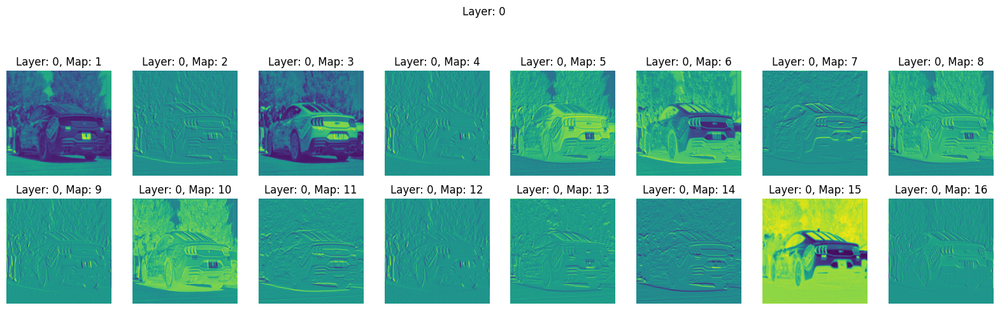

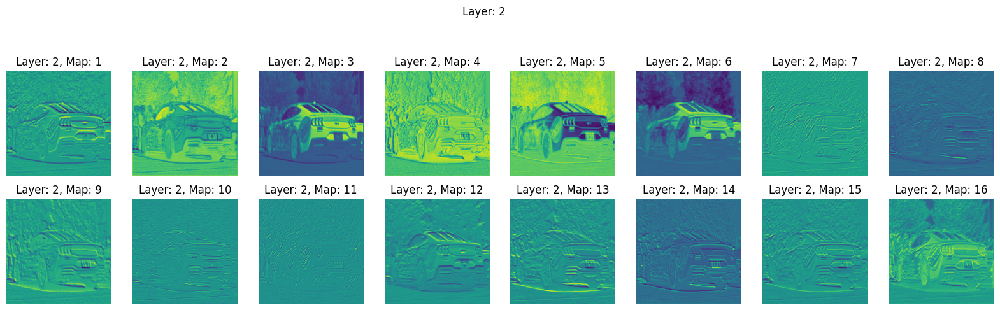

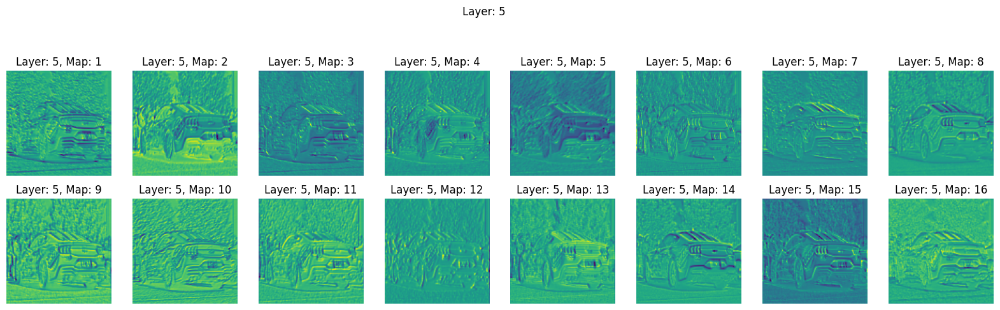

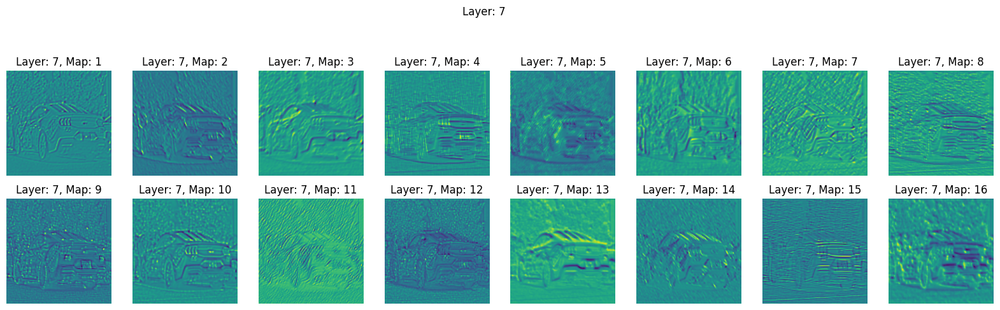

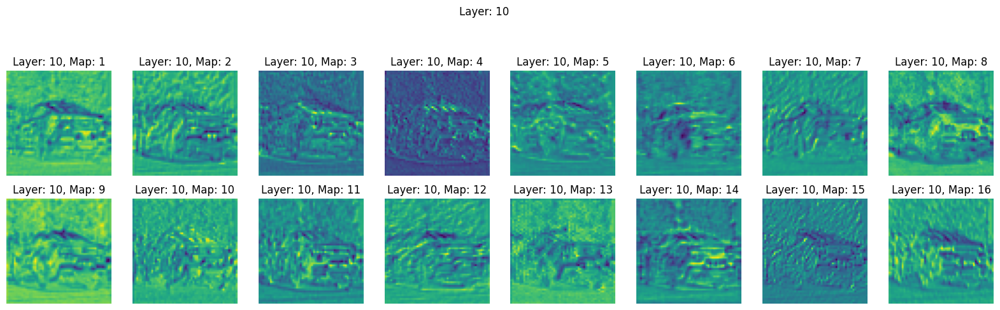

...

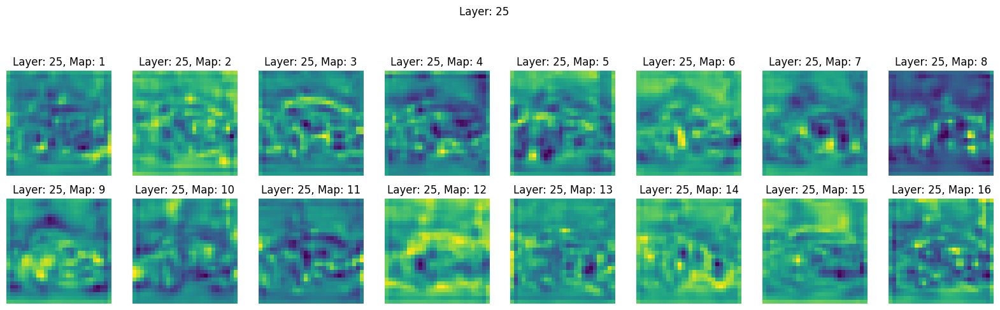

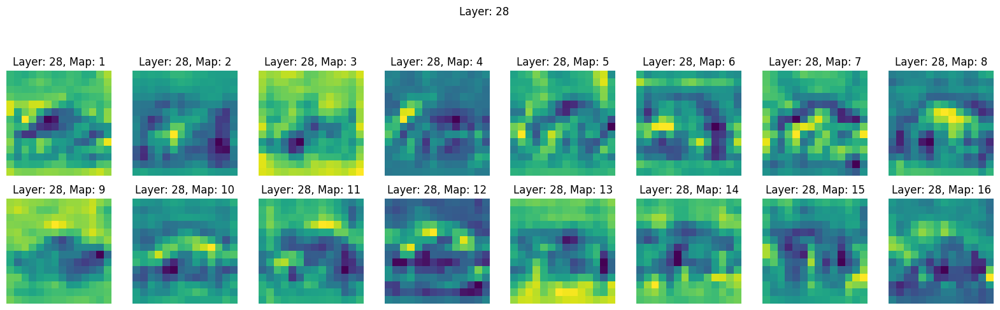

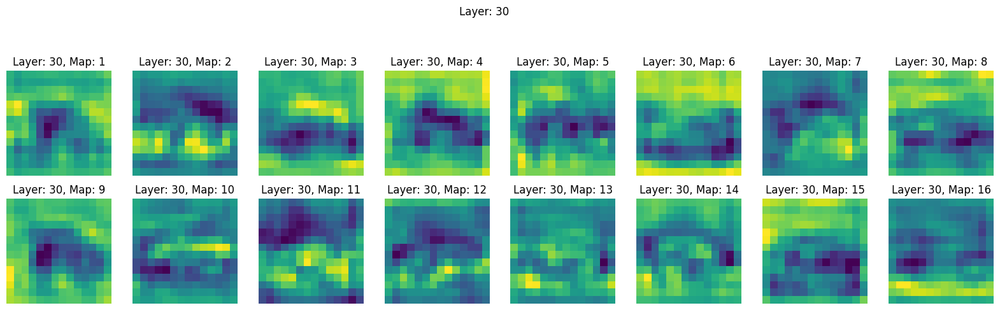

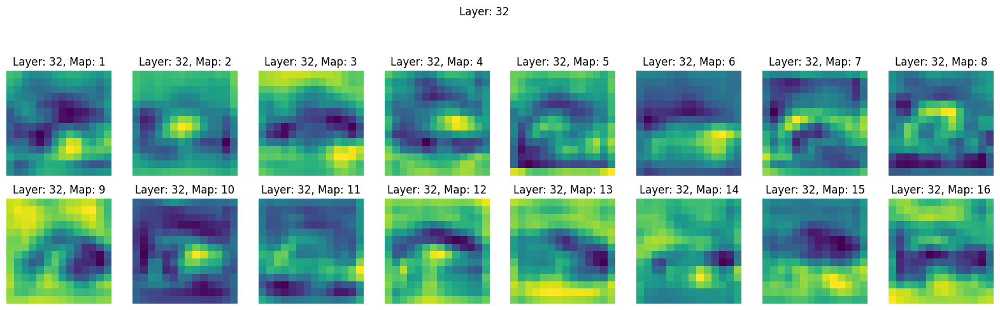

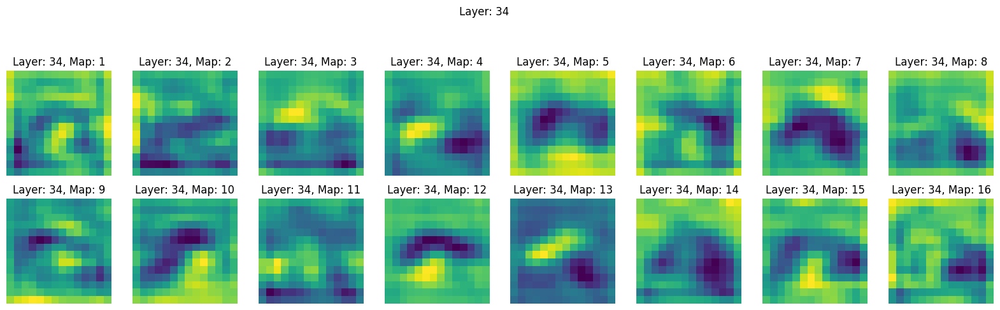

In [24]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Load pre-trained VGG19 model
vgg19 = models.vgg19(pretrained=True)

# Set the model to evaluation mode
vgg19.eval()

# Define a function to visualize feature maps
def visualize_feature_maps(model, input_image):
    # Preprocess the input image
    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize to VGG19 input size
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet normalization
    ])

    input_tensor = preprocess(input_image)
    input_batch = input_tensor.unsqueeze(0)  # Create a mini-batch as expected by the model

    # Forward pass through the model
    with torch.no_grad():
        features = input_batch
        for name, layer in model.features.named_children():
            features = layer(features)
            if isinstance(layer, torch.nn.Conv2d):
                # Get the feature maps after ReLU activation
                feature_maps = features.squeeze(0).cpu().numpy()

                # Plot the first 16 feature maps
                plt.figure(figsize=(20, 10))
                for i in range(min(16, feature_maps.shape[0])):
                    plt.subplot(4, 8, i + 1)
                    plt.imshow(feature_maps[i], cmap='viridis')
                    plt.axis('off')
                    plt.title(f'Layer: {name}, Map: {i+1}')
                plt.suptitle(f'Layer: {name}')
                plt.show()

# Example usage:
# Load your image (replace 'input_image.jpg' with your image path)
input_image = Image.open("./Images/Neural_Transfer/Car.jpeg").convert('RGB')

# Visualize feature maps for each Conv2D layer in VGG19
visualize_feature_maps(vgg19, input_image)

It's fun too look under the hood, isn't it? As you can see, we can guess what are the learned features in each layer if the network (at least in the first layers). For example, in the first layer, the network learns to detect edges, and in the second layer, it learns to detect simple shapes. In the deeper layers, the network learns to detect more complex features.

### 2.3 - Content and Style Loss (15/90 pts)

In order to learn the correct image and keep the content of the original image while applying the style of the seconf image, we need 2 losses: 1. Content Loss and 2. Style Loss. Let's delve into each one!

**Content Loss** is responsible for keeping the content of the original image. It is calculated as the mean squared error between the feature maps of the original image and the generated image.

In [25]:
import torch
import torch.nn as nn

class ContentLoss(nn.Module):
    def __init__(self, target):
        super(ContentLoss, self).__init__()
        # We detach the target content from the tree used
        self.target = target.detach()

    def forward(self, input):
        # Calculate the content loss
        self.loss = nn.functional.mse_loss(input, self.target)
        return input  # Return input as-is (identity operation)

    def get_loss(self):
        return self.loss

**Style Loss** is responsible for applying the style of the second image to the generated image. It is calculated as the mean squared error between the Gram matrices of the feature maps of the second image and the generated image.

In [55]:
import torch

def gram_calculator(input_features):
    B, C, H, W = input_features.size() if len(input_features.size()) == 4 else (1, *input_features.size())
    features = input_features.view(B, C, H * W)
    gram = torch.bmm(features, features.transpose(1, 2))
    return gram / (C * H * W)

In [45]:
import torch
import torch.nn as nn

class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target_gram = gram_calculator(target_feature).detach()

    def forward(self, input_feature):
        G = gram_calculator(input_feature)
        self.loss = nn.functional.mse_loss(G, self.target_gram)
        return input_feature

    def get_loss(self):
        return self.loss


Now, we use `features` part of the VGG model to extract features from the content and style images. Then, we calculate the content and style loss using the extracted features.

In [46]:
# Load the pre-trained VGG19 model
vgg19 = models.vgg19(pretrained=True)

# Get the features part of the VGG19 model
cnn = vgg19.features

In [47]:
import torch
import torchvision.transforms as transforms
from PIL import Image

# Define normalization mean and std for the VGG19 model
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406])
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225])

# Create a transformation to normalize images
normalize = transforms.Normalize(mean=cnn_normalization_mean, std=cnn_normalization_std)

# Define a function to load and preprocess an image
def load_image(image_path, transform=None, max_size=None, shape=None):
    image = Image.open(image_path)
    if max_size:
        scale = max_size / max(image.size)
        size = tuple([int(x * scale) for x in image.size])
        image = image.resize(size, Image.ANTIALIAS)
    if shape:
        image = image.resize(shape, Image.LANCZOS)
    if transform:
        image = transform(image).unsqueeze(0)
    return image

# Example usage:
image_path = "./Images/Neural_Transfer/Content.jpeg"
transform = transforms.Compose([
    transforms.ToTensor(),  # Convert PIL image to tensor
    normalize  # Normalize image
])

image = load_image(image_path, transform)

# Now `image` is normalized and can be fed into VGG19 model

Please note that after which layers you should calculate the content loss and after which ones, you should calculate the style loss. Use the layer names you saw earlier in the `torchsummary` output for VGG19 model.

In [49]:
content_layers_default = ['conv4_2']
style_layers_default = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1', 'conv5_1']

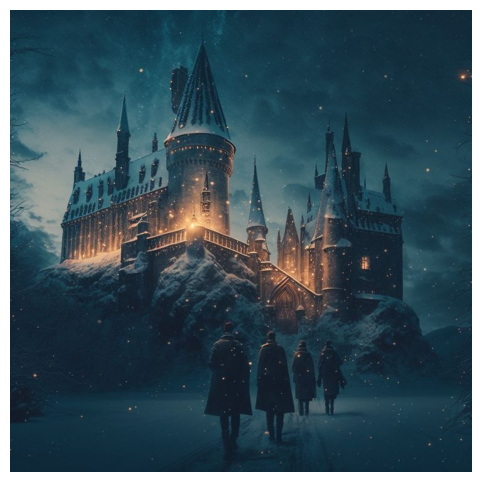

In [48]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image

# Example image path
image_path = './Images/Neural_Transfer/Content.jpeg'

# Load the image using PIL
image = Image.open(image_path)

# Convert PIL image to numpy array
image_np = transforms.ToTensor()(image).numpy()

# Plot the image using matplotlib
plt.figure(figsize=(8, 6))
plt.imshow(image_np.transpose(1, 2, 0))  # Transpose to (H, W, C) format for matplotlib
plt.axis('off')  # Turn off axis
plt.show()

(15/90 pts) Now, we need to define our optimizer. We use `LBFGS` optimizer. Let's get familiar with this optimizer a little bit:

Let's use this optimizer to optimize a simple function $f(x) = x^2$. We want to find the minimum of this function using `LBFGS` optimizer. First, you should initialize a tensor $x$ with a random value. Then, you should define a closure function that calculates the value of the function and its gradient. Finally, you should use the `step` method of the optimizer to update the value of $x$.

And lastly, you should generate an animation using `matplotlib.animation` to show how the value of $x$ changes during optimization.

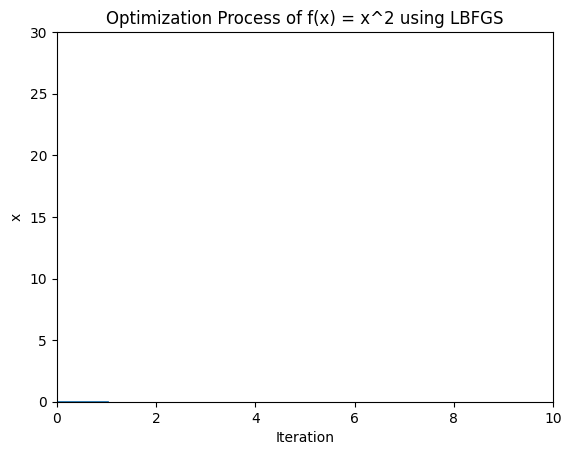

In [59]:
import torch
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import IPython.display as display
from torch.optim import LBFGS

# Step 1: Define a simple quadratic function f(x) = x^2
def f(x):
    return x**2

# Step 2: Initialize a tensor with a single random value
x = torch.tensor([5.0], requires_grad=True)

# Step 3: Define the closure function for LBFGS optimizer
def closure():
    optimizer.zero_grad()
    output = f(x)
    output.backward()
    return output

# Step 4: Create LBFGS optimizer
optimizer = LBFGS([x])

# Step 5: Define animation update function
x_history = []
def update(i):
    optimizer.step(closure)
    x_history.append(x.item())
    line.set_data(range(len(x_history)), x_history)
    return line,

# Step 6: Set up the figure and animation
fig, ax = plt.subplots()
ax.set_xlim(0, 10)  # Adjust xlim based on the number of iterations
ax.set_ylim(0, 30)  # Adjust ylim based on the range of x values
line, = ax.plot([], [], lw=2)

ani = animation.FuncAnimation(fig, update, frames=range(50), interval=200, blit=True)

plt.xlabel('Iteration')
plt.ylabel('x')
plt.title('Optimization Process of f(x) = x^2 using LBFGS')

# Display the animation within the Jupyter notebook
display.display(plt.gcf())
plt.close()

(35/90 pts) Now, let's use this optimizer to optimize our `input_image` to minimize the content and style loss. You should define a closure function that calculates the content and style loss and their gradients. Then, you should use the `step` method of the optimizer to update the value of the `input_image`. Please also **note** that you should use a weighted sum of the content and style loss to optimize the input image. (weight of each loss is a hyperparameter)

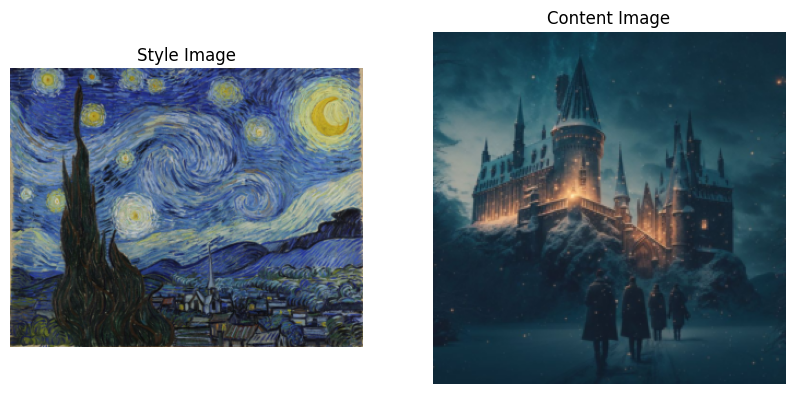

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Style Loss: 1.5883994137766422e-06
Content Loss: 0.0
Total Loss: 0.0015883994055911899
Style Loss: 1.020227045955835e-06
Content Loss: 0.895531177520752
Total Loss: 0.8965514302253723
Style Loss: 1.2941368368046824e-06
Content Loss: 0.3348185420036316
Total Loss: 0.3361126780509949
Style Loss: 1.4215886494639562e-06
Content Loss: 0.28722748160362244
Total Loss: 0.2886490821838379
Style Loss: 1.4235969274523086e-06
Content Loss: 0.23436835408210754
Total Loss: 0.23579195141792297
Style Loss: 1.3788660453428747e-06
Content Loss: 0.20479291677474976
Total Loss: 0.20617178082466125
Style Loss: 1.344222937404993e-06
Content Loss: 0.18370744585990906
Total Loss: 0.18505166471004486
Style Loss: 1.3304110098033561e-06
Content Loss: 0.1624949723482132
Total Loss: 0.1638253778219223
Style Loss: 1.3219836318967282e-06
Content Loss: 0.14605887234210968
Total Loss: 0.14738085865974426
Style Loss: 1.3173390698284493e-06
Content Loss: 0.132409930229187
Total Loss: 0.1337272673845291
Style Loss: 1.314

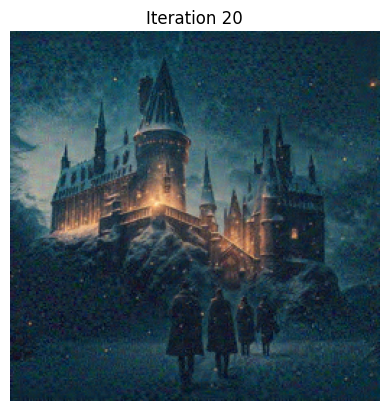

Style Loss: 1.3177102573536104e-06
Content Loss: 0.05857405066490173
Total Loss: 0.05989176034927368
Style Loss: 1.3202518402977148e-06
Content Loss: 0.05549046769738197
Total Loss: 0.05681071802973747
Style Loss: 1.3227929684944684e-06
Content Loss: 0.05265764892101288
Total Loss: 0.05398044362664223
Style Loss: 1.3256533293315442e-06
Content Loss: 0.049860045313835144
Total Loss: 0.05118569731712341
Style Loss: 1.3282324289320968e-06
Content Loss: 0.047324735671281815
Total Loss: 0.04865296930074692
Style Loss: 1.3302360457601026e-06
Content Loss: 0.04503573477268219
Total Loss: 0.046365972608327866
Style Loss: 1.332255692432227e-06
Content Loss: 0.04299042373895645
Total Loss: 0.04432268068194389
Style Loss: 1.3343400269150152e-06
Content Loss: 0.04099990427494049
Total Loss: 0.04233424365520477
Style Loss: 1.3360064485823386e-06
Content Loss: 0.03914202004671097
Total Loss: 0.04047802835702896
Style Loss: 1.3373452247833484e-06
Content Loss: 0.037505049258470535
Total Loss: 0.03884

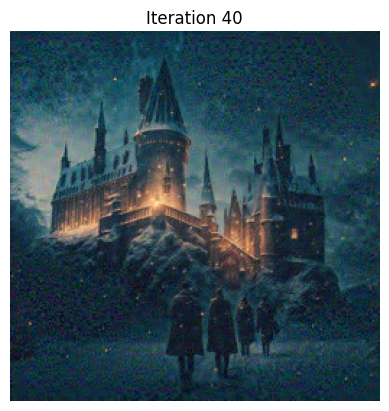

Style Loss: 1.3496963902071002e-06
Content Loss: 0.02486453577876091
Total Loss: 0.0262142326682806
Style Loss: 1.3501867215381935e-06
Content Loss: 0.02410714328289032
Total Loss: 0.02545733004808426
Style Loss: 1.3506391951523256e-06
Content Loss: 0.023374004289507866
Total Loss: 0.024724643677473068
Style Loss: 1.350725597148994e-06
Content Loss: 0.02270350232720375
Total Loss: 0.024054227396845818
Style Loss: 1.351092350887484e-06
Content Loss: 0.022052515298128128
Total Loss: 0.023403607308864594
Style Loss: 1.351544824501616e-06
Content Loss: 0.021449830383062363
Total Loss: 0.02280137501657009
Style Loss: 1.3522210338123841e-06
Content Loss: 0.020887183025479317
Total Loss: 0.022239403799176216
Style Loss: 1.3527165947380126e-06
Content Loss: 0.02032899111509323
Total Loss: 0.021681707352399826
Style Loss: 1.3530143405660056e-06
Content Loss: 0.01981567218899727
Total Loss: 0.02116868644952774
Style Loss: 1.3532942375604762e-06
Content Loss: 0.01933038979768753
Total Loss: 0.020

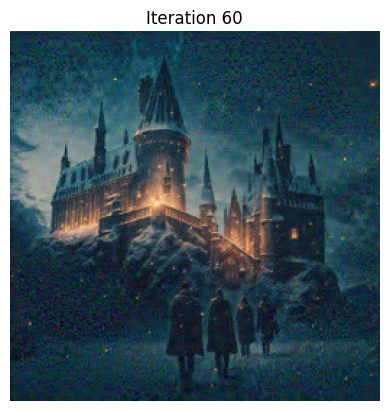

Style Loss: 1.3549205277740839e-06
Content Loss: 0.015413641929626465
Total Loss: 0.0167685616761446
Style Loss: 1.3550881021728856e-06
Content Loss: 0.014981851913034916
Total Loss: 0.016336940228939056
Style Loss: 1.3551127722166711e-06
Content Loss: 0.014759117737412453
Total Loss: 0.016114231199026108
Style Loss: 1.3555593341152417e-06
Content Loss: 0.014571815729141235
Total Loss: 0.015927374362945557
Style Loss: 1.3551109532272676e-06
Content Loss: 0.01421339064836502
Total Loss: 0.015568501316010952
Style Loss: 1.355405629510642e-06
Content Loss: 0.014038799330592155
Total Loss: 0.01539420522749424
Style Loss: 1.3552461268773186e-06
Content Loss: 0.013776106759905815
Total Loss: 0.015131352469325066
Style Loss: 1.3553587905335007e-06
Content Loss: 0.013523274101316929
Total Loss: 0.014878632500767708
Style Loss: 1.355497943222872e-06
Content Loss: 0.013380134478211403
Total Loss: 0.014735632576048374
Style Loss: 1.3556879139287048e-06
Content Loss: 0.013153462670743465
Total Los

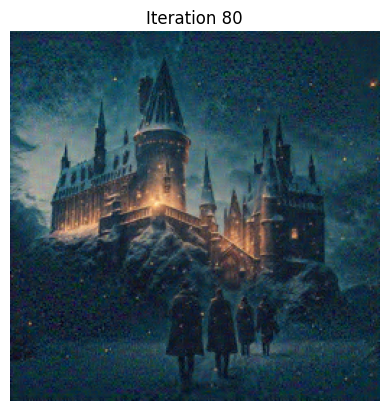

Style Loss: 1.3567922678703326e-06
Content Loss: 0.011395309120416641
Total Loss: 0.012752101756632328
Style Loss: 1.3568228496296797e-06
Content Loss: 0.01121527235955
Total Loss: 0.012572094798088074
Style Loss: 1.35641516862961e-06
Content Loss: 0.011136326938867569
Total Loss: 0.012492742389440536
Style Loss: 1.357390374323586e-06
Content Loss: 0.01103278435766697
Total Loss: 0.01239017490297556
Style Loss: 1.356918687633879e-06
Content Loss: 0.01084682997316122
Total Loss: 0.01220374833792448
Style Loss: 1.357032260784763e-06
Content Loss: 0.010769841261208057
Total Loss: 0.01212687324732542
Style Loss: 1.3571178669735673e-06
Content Loss: 0.0107138492166996
Total Loss: 0.012070966884493828
Style Loss: 1.357054657091794e-06
Content Loss: 0.01057184673845768
Total Loss: 0.011928901076316833
Style Loss: 1.3570435157816974e-06
Content Loss: 0.010388997383415699
Total Loss: 0.011746040545403957
Style Loss: 1.3573330761573743e-06
Content Loss: 0.010242682881653309
Total Loss: 0.0116000

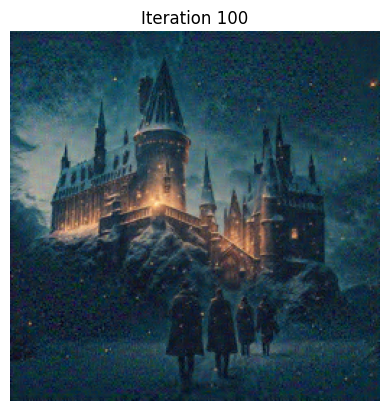

Style Loss: 1.3581002349383198e-06
Content Loss: 0.009172041900455952
Total Loss: 0.010530142113566399
Style Loss: 1.3586965224021696e-06
Content Loss: 0.00919906236231327
Total Loss: 0.010557758621871471
Style Loss: 1.3583652389570489e-06
Content Loss: 0.009095410816371441
Total Loss: 0.010453776456415653
Style Loss: 1.3586308114099666e-06
Content Loss: 0.008911965414881706
Total Loss: 0.010270596481859684
Style Loss: 1.3587017519967048e-06
Content Loss: 0.008866993710398674
Total Loss: 0.010225695557892323
Style Loss: 1.3589917671197327e-06
Content Loss: 0.008724343031644821
Total Loss: 0.010083334520459175
Style Loss: 1.3587954299509875e-06
Content Loss: 0.008655850775539875
Total Loss: 0.010014645755290985
Style Loss: 1.3586209206550848e-06
Content Loss: 0.00865177158266306
Total Loss: 0.010010392405092716
Style Loss: 1.3597284578281688e-06
Content Loss: 0.00853834580630064
Total Loss: 0.009898073971271515
Style Loss: 1.358537929263548e-06
Content Loss: 0.008428918197751045
Total L

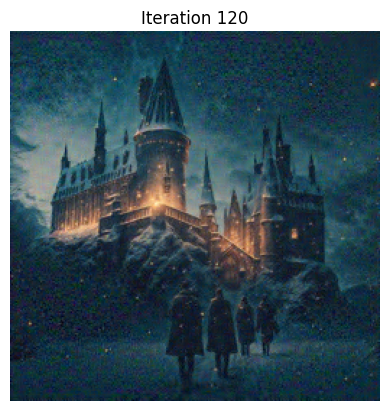

Style Loss: 1.3607533446702291e-06
Content Loss: 0.007825017906725407
Total Loss: 0.009185771457850933
Style Loss: 1.3591200058726827e-06
Content Loss: 0.007796724326908588
Total Loss: 0.00915584433823824
Style Loss: 1.3606656921183458e-06
Content Loss: 0.007817874662578106
Total Loss: 0.009178540669381618
Style Loss: 1.3600314332506969e-06
Content Loss: 0.007879888638854027
Total Loss: 0.009239920414984226
Style Loss: 1.3606935453935876e-06
Content Loss: 0.007922008633613586
Total Loss: 0.009282702580094337
Style Loss: 1.359999941996648e-06
Content Loss: 0.007962164469063282
Total Loss: 0.009322164580225945
Style Loss: 1.360717419629509e-06
Content Loss: 0.007956855930387974
Total Loss: 0.00931757315993309
Style Loss: 1.3606052107206779e-06
Content Loss: 0.00799152348190546
Total Loss: 0.009352128952741623
Style Loss: 1.360729697807983e-06
Content Loss: 0.007763676345348358
Total Loss: 0.009124405682086945
Style Loss: 1.3609726465801941e-06
Content Loss: 0.007878844626247883
Total Los

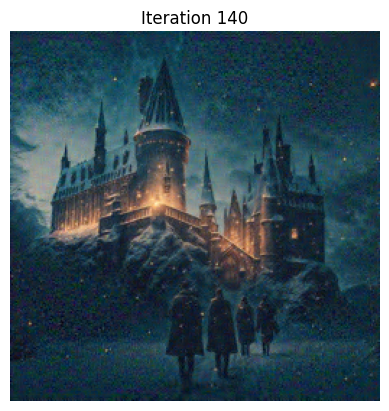

Style Loss: 1.3614528597827302e-06
Content Loss: 0.007196364924311638
Total Loss: 0.0085578178986907
Style Loss: 1.3619628589367494e-06
Content Loss: 0.007343795616179705
Total Loss: 0.00870575848966837
Style Loss: 1.361277782052639e-06
Content Loss: 0.0071286954917013645
Total Loss: 0.008489972911775112
Style Loss: 1.3616447631648043e-06
Content Loss: 0.007112032733857632
Total Loss: 0.008473677560687065
Style Loss: 1.3618614502775017e-06
Content Loss: 0.0070754848420619965
Total Loss: 0.008437346667051315
Style Loss: 1.3614976523967925e-06
Content Loss: 0.007017686031758785
Total Loss: 0.00837918370962143
Style Loss: 1.3616074738820316e-06
Content Loss: 0.006971324328333139
Total Loss: 0.008332931436598301
Style Loss: 1.3613805549539393e-06
Content Loss: 0.006898560095578432
Total Loss: 0.008259940892457962
Style Loss: 1.3615132274935604e-06
Content Loss: 0.006853551138192415
Total Loss: 0.00821506418287754
Style Loss: 1.3620563095173566e-06
Content Loss: 0.0067638009786605835
Total 

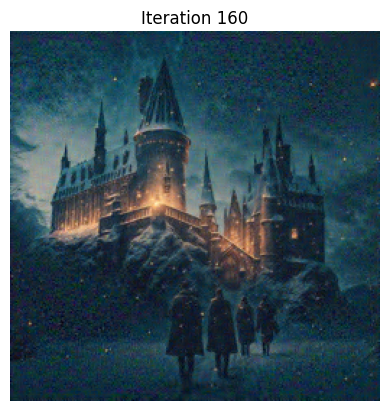

Style Loss: 1.3632807167596184e-06
Content Loss: 0.006360573694109917
Total Loss: 0.007723854389041662
Style Loss: 1.3612390148409759e-06
Content Loss: 0.006458440329879522
Total Loss: 0.00781967956572771
Style Loss: 1.3641652003570925e-06
Content Loss: 0.006572099402546883
Total Loss: 0.007936264388263226
Style Loss: 1.361294948765135e-06
Content Loss: 0.006624465808272362
Total Loss: 0.00798576045781374
Style Loss: 1.364262175229669e-06
Content Loss: 0.006560126785188913
Total Loss: 0.007924389094114304
Style Loss: 1.3615870102512417e-06
Content Loss: 0.0063797347247600555
Total Loss: 0.007741321809589863
Style Loss: 1.363260025755153e-06
Content Loss: 0.006251639686524868
Total Loss: 0.007614899426698685
Style Loss: 1.3633385833600187e-06
Content Loss: 0.006315089762210846
Total Loss: 0.007678428199142218
Style Loss: 1.3625140127260238e-06
Content Loss: 0.006335522048175335
Total Loss: 0.007698035798966885
Style Loss: 1.363689648314903e-06
Content Loss: 0.006233623251318932
Total Lo

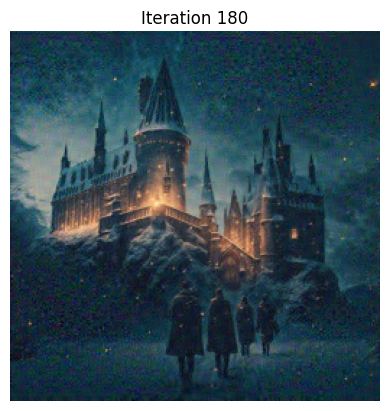

Style Loss: 1.3639964890899137e-06
Content Loss: 0.006276731379330158
Total Loss: 0.007640727795660496
Style Loss: 1.363382580166217e-06
Content Loss: 0.006181673146784306
Total Loss: 0.0075450558215379715
Style Loss: 1.3638086784339976e-06
Content Loss: 0.005981890484690666
Total Loss: 0.007345699239522219
Style Loss: 1.364824129268527e-06
Content Loss: 0.0059002963826060295
Total Loss: 0.0072651207447052
Style Loss: 1.3627931139126304e-06
Content Loss: 0.005951201543211937
Total Loss: 0.007313994690775871
Style Loss: 1.3648781305164448e-06
Content Loss: 0.00583394942805171
Total Loss: 0.007198827341198921
Style Loss: 1.364404283776821e-06
Content Loss: 0.0058417306281626225
Total Loss: 0.0072061349637806416
Style Loss: 1.3635440154757816e-06
Content Loss: 0.006008520256727934
Total Loss: 0.007372064515948296
Style Loss: 1.3645967555930838e-06
Content Loss: 0.006084317807108164
Total Loss: 0.007448914460837841
Style Loss: 1.3637703659696854e-06
Content Loss: 0.0060678813606500626
Tota

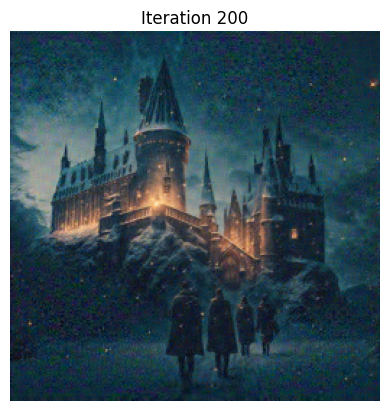

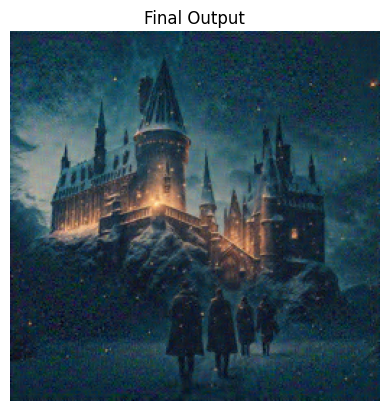

In [2]:
import torch
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

# Paths to your content and style images
content_path = './Images/Neural_Transfer/Content.jpeg'
style_path = './Images/Neural_Transfer/style.jpeg'

# Function to load an image and transform it into a tensor
loader = transforms.Compose([
    transforms.Resize(256),  # Resize to a smaller size
    transforms.ToTensor()    # Convert to tensor
])

def image_loader(image_paths):
    batch = []
    for path in image_paths:
        image = Image.open(path)
        image = loader(image).unsqueeze(0)
        batch.append(image)
    return torch.cat(batch, dim=0).to(device, torch.float)

# Initialize your device (GPU if available, else CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load style and content images as tensors
style_img = image_loader([style_path])
content_img = image_loader([content_path])

# Display the content and style images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(transforms.ToPILImage()(style_img[0].cpu()))
plt.title('Style Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(transforms.ToPILImage()(content_img[0].cpu()))
plt.title('Content Image')
plt.axis('off')
plt.show()

# Convert VGG model to TorchScript for faster inference
class VGGFeatures(torch.nn.Module):
    def __init__(self):
        super(VGGFeatures, self).__init__()
        self.vgg_layers = torch.jit.script(models.vgg19(pretrained=True).features)
        self.layer_names = ['0', '5', '10', '19', '28']  # Layers for content and style representation

    def forward(self, x):
        features = {}
        for name, layer in self.vgg_layers._modules.items():
            x = layer(x)
            if name in self.layer_names:
                features[name] = x
        return features

# Initialize the VGG model and set to evaluation mode
vgg = VGGFeatures().to(device).eval()

# Gram matrix function for style representation
def gram_matrix(input):
    b, c, h, w = input.size()
    features = input.view(b * c, h * w)
    G = torch.mm(features, features.t())
    return G.div(b * c * h * w)

# Content loss function
def content_loss(input, target):
    return torch.mean((input - target) ** 2)

# Style loss function
def style_loss(input, target):
    G_input = gram_matrix(input)
    G_target = gram_matrix(target)
    return torch.mean((G_input - G_target) ** 2)

# Initialize your input image to optimize, typically a copy of content image
batch_size = 1  # Adjust batch size based on memory constraints
input_img = image_loader([content_path] * batch_size).clone().requires_grad_(True)

# Define hyperparameters
alpha = 1  # Weight of content loss
beta = 1000  # Weight of style loss

# Adam optimizer
optimizer = optim.Adam([input_img], lr=0.01)

# Closure function to evaluate losses and gradients
def closure():
    optimizer.zero_grad()

    # Pass through VGG model to get content and style features
    model_content = vgg(content_img)
    model_style = vgg(style_img)
    model_input = vgg(input_img)

    # Compute content loss
    content_loss_val = content_loss(model_input['19'], model_content['19'])

    # Compute style loss
    style_loss_val = 0
    for layer in ['0', '5', '10', '19', '28']:
        style_loss_val += style_loss(model_input[layer], model_style[layer])
    style_loss_val /= len(['0', '5', '10', '19', '28'])  # Average style loss

    # Total loss
    total_loss = alpha * content_loss_val + beta * style_loss_val
    total_loss.backward()

    # Print losses
    print('Style Loss:', style_loss_val.item())
    print('Content Loss:', content_loss_val.item())
    print('Total Loss:', total_loss.item())

    return total_loss

# Number of optimization steps (iterations)
num_steps = 200

# List to store intermediate images for plotting
plot_images = []

# Optimization loop
for i in range(num_steps):
    optimizer.step(closure)

    # Clip the image to be in the range [0, 1]
    input_img.data.clamp_(0, 1)

    # Plot the image every 20 iterations
    if (i+1) % 20 == 0:
        plot_images.append(input_img.clone().detach())
        plt.figure()
        img = transforms.ToPILImage()(input_img[0].cpu())
        plt.imshow(img)
        plt.title(f'Iteration {i+1}')
        plt.axis('off')
        plt.show()

# Final output image after optimization
final_output = transforms.ToPILImage()(input_img[0].cpu())
plt.figure()
plt.imshow(final_output)
plt.title('Final Output')
plt.axis('off')
plt.show()

In [ ]:
content_path = './Images/Neural_Transfer/Content.jpeg'
style_path = './Images/Neural_Transfer/style.jpeg'

Now, let's see the result of optimization process on our `input_image`.

(5/90 pts) Also, let's plot our `style_losses`, `content_losses` and `total_losses` to see how they change during the optimization process.

In [4]:
# Define transforms to preprocess images for VGG
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load content and style images
content = Image.open(content_path)
style = Image.open(style_path)

content = transform(content).unsqueeze(0)
style = transform(style).unsqueeze(0)

# Move images to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
content = content.to(device)
style = style.to(device)

# Step 4: Initialize input_image (e.g., with a copy of the content image or a random noise image)
input_image = Variable(content.clone(), requires_grad=True)

# Step 5: Setup LBFGS optimizer
optimizer = optim.LBFGS([input_image])

# Step 6: Define model and extract features

# Define a pre-trained VGG model (you can use any other model as well)
model = models.vgg19(pretrained=True).features.eval().to(device)

# Pass content and style images through the model to get features
content_features = model(content)
style_features = model(style)

# Define target features for content and style
target_content_features = content_features.detach()
target_style_features = style_features.detach()

# Step 7: Main optimization loop
alpha = 1.0  # Weight for content loss
beta = 1000.0  # Weight for style loss
num_iterations = 300  # Total number of iterations

style_losses = []
content_losses = []
total_losses = []

for i in range(num_iterations):
    optimizer.step(closure)  # Perform optimization step

    # Clip image tensor values to [0, 1]
    input_image.data.clamp_(0, 1)

# Plotting the losses
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_iterations + 1), style_losses, label='Style Loss')
plt.plot(range(1, num_iterations + 1), content_losses, label='Content Loss')
plt.plot(range(1, num_iterations + 1), total_losses, label='Total Loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.title('Style Loss, Content Loss, and Total Loss during Optimization')
plt.legend()
plt.grid(True)
plt.show()

# Display the optimized image
output_image = input_image.detach().squeeze(0).cpu()
output_image = transforms.ToPILImage()(output_image.clamp(0, 1))

plt.figure(figsize=(8, 8))
plt.imshow(output_image)
plt.axis('off')
plt.title('Optimized Image')
plt.show()
...

NameError: name 'Variable' is not defined

In [5]:
# Load content and style images
content = Image.open(content_path)
style = Image.open(style_path)

content = transform(content).unsqueeze(0)
style = transform(style).unsqueeze(0)

# Move images to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
content = content.to(device)
style = style.to(device)

# Step 4: Initialize input_image (e.g., with a copy of the content image or a random noise image)
input_image = Variable(content.clone(), requires_grad=True)

# Step 5: Setup LBFGS optimizer
optimizer = optim.LBFGS([input_image])

# Step 6: Define model and extract features

# Define a pre-trained VGG model (you can use any other model as well)
model = models.vgg19(pretrained=True).features.eval().to(device)

# Pass content and style images through the model to get features
content_features = model(content)
style_features = model(style)

# Define target features for content and style
target_content_features = content_features.detach()
target_style_features = style_features.detach()

# Step 7: Main optimization loop
alpha = 1.0  # Weight for content loss
beta = 1000.0  # Weight for style loss
num_iterations = 300  # Total number of iterations

style_losses = []
content_losses = []
total_losses = []

for i in range(num_iterations):
    optimizer.step(closure)  # Perform optimization step

    # Clip image tensor values to [0, 1]
    input_image.data.clamp_(0, 1)

# Plotting the style loss
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_iterations + 1), style_losses, label='Style Loss')
plt.xlabel('Iterations')
plt.ylabel('Style Loss')
plt.title('Style Loss during Optimization')
plt.legend()
plt.grid(True)
plt.show()

# Display the optimized image
output_image = input_image.detach().squeeze(0).cpu()
output_image = transforms.ToPILImage()(output_image.clamp(0, 1))

plt.figure(figsize=(8, 8))
plt.imshow(output_image)
plt.axis('off')
plt.title('Optimized Image')
plt.show()

NameError: name 'Variable' is not defined

In [6]:
# Load content and style images
content = Image.open(content_path)
style = Image.open(style_path)

content = transform(content).unsqueeze(0)
style = transform(style).unsqueeze(0)

# Move images to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
content = content.to(device)
style = style.to(device)

# Step 4: Initialize input_image (e.g., with a copy of the content image or a random noise image)
input_image = Variable(content.clone(), requires_grad=True)

# Step 5: Setup LBFGS optimizer
optimizer = optim.LBFGS([input_image])

# Step 6: Define model and extract features

# Define a pre-trained VGG model (you can use any other model as well)
model = models.vgg19(pretrained=True).features.eval().to(device)

# Pass content and style images through the model to get features
content_features = model(content)
style_features = model(style)

# Define target features for content and style
target_content_features = content_features.detach()
target_style_features = style_features.detach()

# Step 7: Main optimization loop
alpha = 1.0  # Weight for content loss
beta = 1000.0  # Weight for style loss
num_iterations = 300  # Total number of iterations

style_losses = []
content_losses = []
total_losses = []

for i in range(num_iterations):
    optimizer.step(closure)  # Perform optimization step

    # Clip image tensor values to [0, 1]
    input_image.data.clamp_(0, 1)

# Plotting the content loss
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_iterations + 1), content_losses, label='Content Loss')
plt.xlabel('Iterations')
plt.ylabel('Content Loss')
plt.title('Content Loss during Optimization')
plt.legend()
plt.grid(True)
plt.show()

# Display the optimized image
output_image = input_image.detach().squeeze(0).cpu()
output_image = transforms.ToPILImage()(output_image.clamp(0, 1))

plt.figure(figsize=(8, 8))
plt.imshow(output_image)
plt.axis('off')
plt.title('Optimized Image')
plt.show()

NameError: name 'Variable' is not defined